# Detectron2: Train on a custom dataset
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2/blob/master/Detectron2_train_on_a_custom_dataset.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2/blob/master/Detectron2_train_on_a_custom_dataset.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

## Install detectron2

> **Important**: If you're running on a local machine, be sure to follow the [installation instructions](https://github.com/facebookresearch/detectron2/blob/master/INSTALL.md). This notebook includes only what's necessary to run in Colab.

In [1]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-d8pfgj50
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-d8pfgj50
  Resolved https://github.com/facebookresearch/detectron2.git to commit 18f69583391e5040043ca4f4bebd2c60f0ebfde0
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
detectron2: 0.6


In [3]:
!pip install -U sahi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.3/112.3 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 13.0 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=ceabf5724215ce83f955233e85093cbcb01d56eccc11c922e9b3d133de7f6c2a
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.12.0.88
    Uninstalling opencv-python-4.12.0.88:
      Successfully uninstalled opencv-python-4.12.0.88


## Train on a custom dataset

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

We can also evaluate its performance using AP metric implemented in COCO API.

## Save config

In [ ]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()

## Load trained model

In [ ]:
from detectron2.config import get_cfg
cfg = get_cfg()
cfg.merge_from_file("config.yml")

In [ ]:
predictor = DefaultPredictor(cfg)

In [3]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode

In [5]:
dataset_dicts = []
img_dir = "training/"
for idx, v in enumerate(img_dir):
    record = {}

    #json_file = os.path.join(img_dir, "Screenshot 2025-07-04-" + str(idx+1) + ".json")
    json_file = os.path.join(img_dir, "test.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    print(imgs_anns)

    #filename = os.path.join(img_dir, "Screenshot 2025-07-04-" + str(idx+1) + ".png")
    filename = os.path.join(img_dir, "test.png")
    height, width = cv2.imread(filename).shape[:2]

    record["file_name"] = filename
    record["image_id"] = idx
    record["height"] = height
    record["width"] = width

    objs = []
    for idx1, v in enumerate(imgs_anns):
      for _, anno in v.items():
          flat_coords = []
          for p in v['content']:
              flat_coords.extend([p["x"], p["y"]])

          x_coords = [p["x"] for p in v['content']]
          y_coords = [p["y"] for p in v['content']]

          bbox = [min(x_coords), min(y_coords), max(x_coords), max(y_coords)]

          obj = {
              "bbox": bbox,
              "bbox_mode": BoxMode.XYXY_ABS,
              "segmentation": flat_coords,
              "category_id": 0,
          }
          objs.append(obj)
    record["annotations"] = objs
    dataset_dicts.append(record)

    if idx >= 6:
      break

[{'content': [{'x': 2.5, 'y': 0}, {'x': 95.5, 'y': 0}, {'x': 95.5, 'y': 85}, {'x': 2.5, 'y': 85}], 'rectMask': {'xMin': 2.5, 'yMin': 0, 'width': 93, 'height': 85}, 'labels': {'labelName': 'unnamed', 'labelColor': 'red', 'labelColorRGB': '255,0,0', 'visibility': False}, 'labelLocation': {'x': 49, 'y': 42.5}, 'contentType': 'rect'}, {'content': [{'x': 98.5, 'y': 0}, {'x': 191.5, 'y': 0}, {'x': 191.5, 'y': 88}, {'x': 98.5, 'y': 88}], 'rectMask': {'xMin': 98.5, 'yMin': 0, 'width': 93, 'height': 88}, 'labels': {'labelName': 'unnamed', 'labelColor': 'red', 'labelColorRGB': '255,0,0', 'visibility': False}, 'labelLocation': {'x': 145, 'y': 44}, 'contentType': 'rect'}, {'content': [{'x': 192.5, 'y': 0}, {'x': 285.5, 'y': 0}, {'x': 285.5, 'y': 88}, {'x': 192.5, 'y': 88}], 'rectMask': {'xMin': 192.5, 'yMin': 0, 'width': 93, 'height': 88}, 'labels': {'labelName': 'unnamed', 'labelColor': 'red', 'labelColorRGB': '255,0,0', 'visibility': False}, 'labelLocation': {'x': 239, 'y': 44}, 'contentType': '

In [6]:
for d in ["train"]:
    DatasetCatalog.register("pipe_" + d, lambda d=d: dataset_dicts)
    MetadataCatalog.get("pipe_" + d).set(thing_classes=["pipe"])

In [7]:
balloon_metadata = MetadataCatalog.get("pipe_train")

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))

cfg.DATASETS.TRAIN = ("pipe_train",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00045 #0.00025
cfg.SOLVER.MAX_ITER = 100
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/23 17:24:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_298dad.pkl: 212MB [00:01, 152MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[07/23 17:24:10 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/23 17:24:21 d2.utils.events]:  eta: 0:00:33  iter: 19  total_loss: 1.682  loss_cls: 0.661  loss_box_reg: 0.8927  loss_rpn_cls: 0.0704  loss_rpn_loc: 0.1019    time: 0.4174  last_time: 0.4171  data_time: 0.0168  last_data_time: 0.0040   lr: 8.5864e-05  max_mem: 1869M
[07/23 17:24:34 d2.utils.events]:  eta: 0:00:25  iter: 39  total_loss: 1.27  loss_cls: 0.4186  loss_box_reg: 0.7837  loss_rpn_cls: 0.02304  loss_rpn_loc: 0.04554    time: 0.4248  last_time: 0.4229  data_time: 0.0084  last_data_time: 0.0149   lr: 0.00017577  max_mem: 1870M
[07/23 17:24:42 d2.utils.events]:  eta: 0:00:16  iter: 59  total_loss: 0.9953  loss_cls: 0.2054  loss_box_reg: 0.7531  loss_rpn_cls: 0.005662  loss_rpn_loc: 0.03298    time: 0.4286  last_time: 0.4365  data_time: 0.0092  last_data_time: 0.0045   lr: 0.00026568  max_mem: 1870M
[07/23 17:24:51 d2.utils.events]:  eta: 0:00:08  iter: 79  total_loss: 0.6738  loss_cls: 0.09068  loss_box_reg: 0.56  loss_rpn_cls: 0.001885  loss_rpn_loc: 0.02796    time: 0.4293 

In [9]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

[07/23 17:28:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


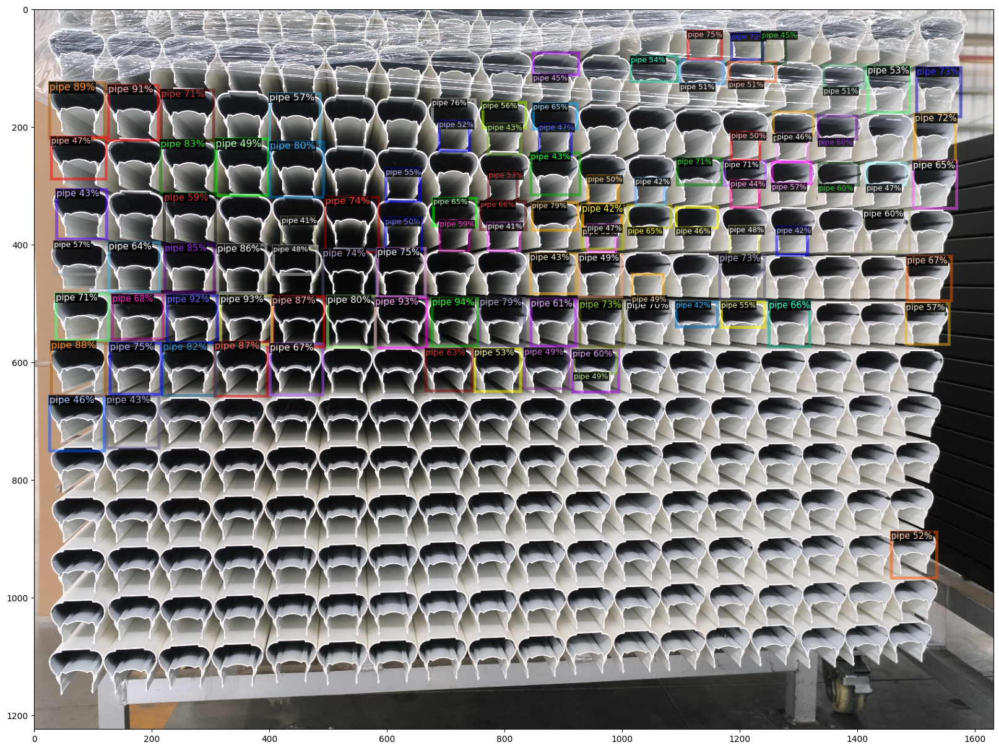

In [17]:
from detectron2.utils.visualizer import ColorMode

#im = cv2.imread("test4.png")
im = cv2.imread("1747025836644.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=1)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (20, 20))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()

In [11]:
# export config as yaml
from sahi.utils.detectron2 import export_cfg_as_yaml
export_cfg_as_yaml(cfg, export_path='output/config.yaml')

In [12]:
# will be used for detectron2 fasterrcnn model zoo name
from sahi.utils.detectron2 import Detectron2TestConstants

# import required functions, classes
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction, predict, get_prediction
from sahi.utils.file import download_from_url
from sahi.utils.cv import read_image
from IPython.display import Image

In [13]:
model_config_path = "output/config.yaml"
model_path = "output/model_final.pth"
detection_model = AutoDetectionModel.from_pretrained(
    model_type='detectron2',
    model_path=model_path,
    config_path=model_config_path,
    confidence_threshold=0.5,
    image_size=1280,
    device="cuda:0", # or 'cuda:0'
)

output/config.yaml not available in Model Zoo!
[07/23 17:28:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from output/model_final.pth ...


In [15]:
result = get_prediction("1747025836644.jpg", detection_model)

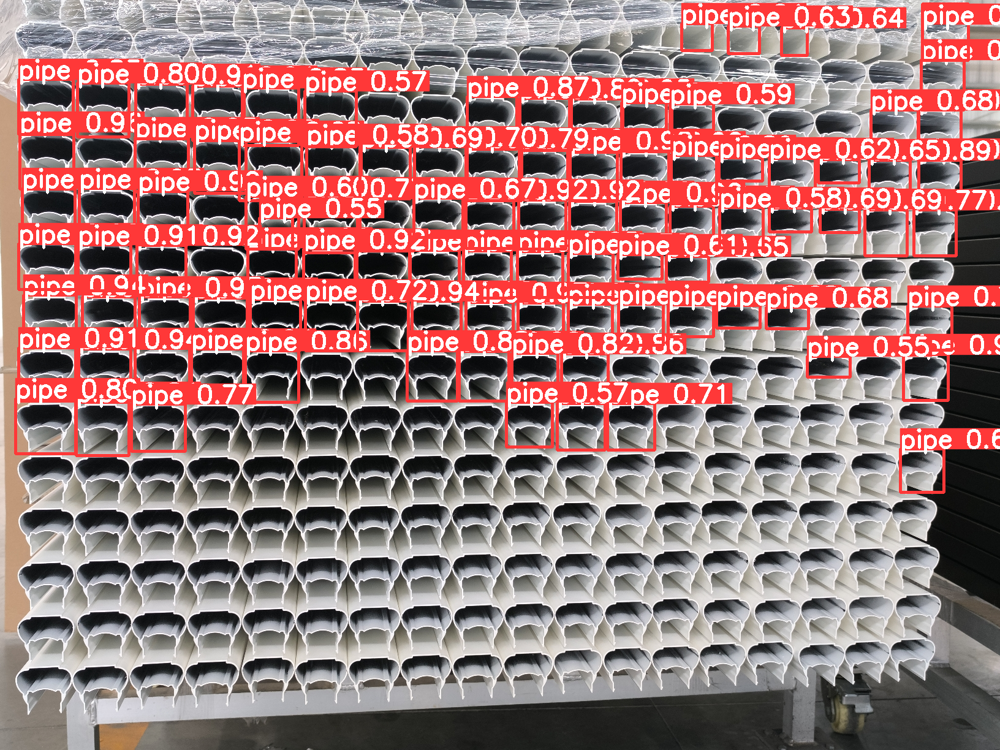

In [16]:
result.export_visuals(export_dir="output/")

Image("output/prediction_visual.png")

In [87]:
result = get_sliced_prediction(
    "1747025836644.jpg",
    detection_model,
    slice_height = 256,
    slice_width = 256,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2,
    postprocess_match_threshold=0.5,
)

Performing prediction on 48 slices.


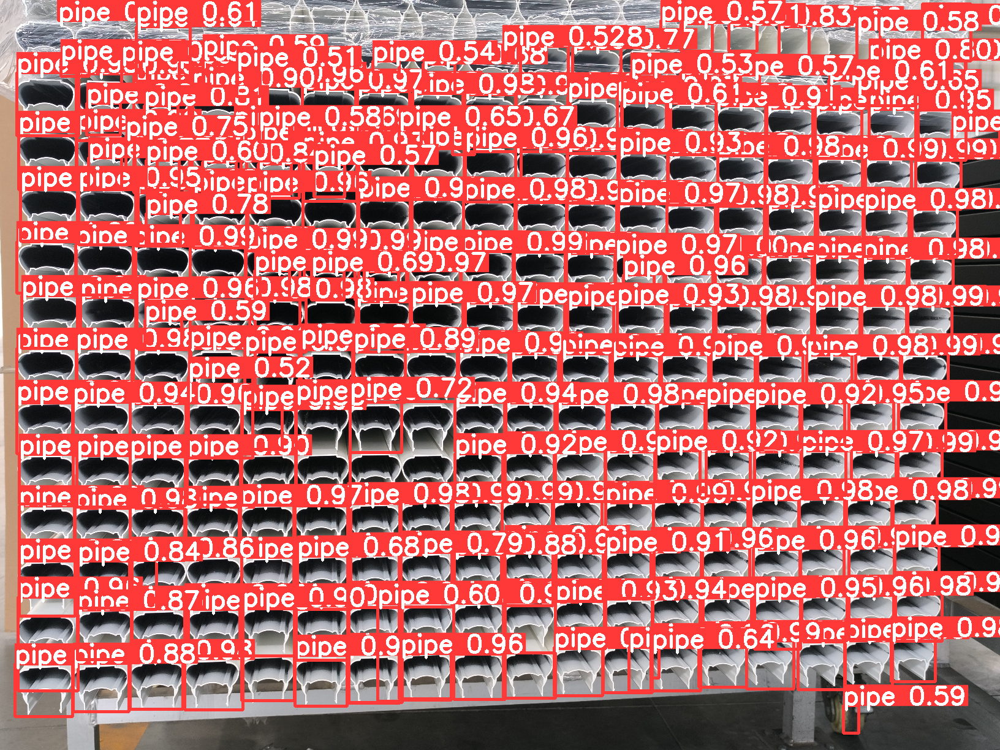

In [88]:
result.export_visuals(export_dir="output/")

Image("output/prediction_visual.png")